In [1]:
import torch
import torch.nn as nn
from torch.utils.data import ConcatDataset, Subset, DataLoader
import numpy as np
import matplotlib.pyplot as plt

from dataset import create_dataloaders
from tcn_model import MEGTCN
from gan_model import MHEGAN
from mlp_model import MLP
from cnn_baseline_1d import CNNBaseline1D
from train import train_one_epoch
from evaluate import evaluate, evaluate_top_models_person_cv
from grid_search import run_grid_search, run_person_grid_search

In [2]:
BATCH_SIZE = 8

In [3]:
INTRA_DATA_DIR = "preprocessed_data/Intra"
intra_train_loader, intra_test_loader = create_dataloaders(INTRA_DATA_DIR, BATCH_SIZE, add_person_id=True)

Loading test data...
Loading train data...
Loaded 32 training samples
Loaded 8 test samples
Class distribution in training: [8 8 8 8]
Class distribution in test: [2 2 2 2]
Train batches: 4
Test batches: 1


### Cross Dataset

In [4]:
CROSS_DATA_DIR = "preprocessed_data/Cross"
BATCH_SIZE = 8
EPOCHS = 30
LEARNING_RATE = 1e-3
NUM_CLASSES = 4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

cross_train_loader, cross_test_loader = create_dataloaders(CROSS_DATA_DIR, BATCH_SIZE, add_person_id=True)

Using device: cuda
Loading test1 data...
Loading test2 data...
Loading test3 data...
Loading train data...
Loaded 64 training samples
Loaded 48 test samples
Class distribution in training: [16 16 16 16]
Class distribution in test: [12 12 12 12]
Train batches: 8
Test batches: 6


In [5]:
cross_dataset = cross_train_loader.dataset
intra_dataset = intra_train_loader.dataset

def build_person_subsets(dataset, source_name):
    """Build subsets of the dataset grouped by person_id."""
    if dataset.person_ids is None:
        raise ValueError(f"{source_name} dataset must be created with add_person_id=True")

    grouped_indices = {}
    for index, person_id in enumerate(dataset.person_ids):
        grouped_indices.setdefault(int(person_id), []).append(index)

    return [
        (f"{source_name}_{person_id}", Subset(dataset, indices), person_id)
        for person_id, indices in sorted(grouped_indices.items())
    ]


cross_person_splits = build_person_subsets(cross_dataset, "cross")
intra_person_splits = build_person_subsets(intra_dataset, "intra")
person_splits = cross_person_splits + intra_person_splits

print("Person-level folds:")
for split_name, subset, person_id in person_splits:
    print(f"  {split_name}: person_id={person_id}, samples={len(subset)}")

Person-level folds:
  cross_113922: person_id=113922, samples=32
  cross_164636: person_id=164636, samples=32
  intra_105923: person_id=105923, samples=32


In [6]:
def cross_validation(
    model_class,
    person_splits,
    learning_rate=LEARNING_RATE,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    model_kwargs=None,
    weight_decay=1e-4,
    patience=8,
    min_delta=1e-3,
):
    """Train one model per person split with early stopping.

    The key anti-overfitting pieces here are:
    - weight decay in the optimizer
    - learning-rate reduction when validation loss plateaus
    - early stopping that restores the best validation checkpoint
    """

    fold_accuracies = []
    model_kwargs = model_kwargs or {}
    use_pin_memory = DEVICE == "cuda"

    for fold, (test_name, test_subset, test_person_id) in enumerate(person_splits):
        train_subsets = [
            subset
            for split_name, subset, _ in person_splits
            if split_name != test_name
        ]

        fold_train_dataset = ConcatDataset(train_subsets)
        fold_train_loader = DataLoader(
            fold_train_dataset,
            batch_size=batch_size,
            shuffle=True,
            pin_memory=use_pin_memory,
        )
        val_loader = DataLoader(
            test_subset,
            batch_size=batch_size,
            shuffle=False,
            pin_memory=use_pin_memory,
        )

        training_accuracies = []
        validation_accuracies = []

        model = model_class(num_classes=NUM_CLASSES, **model_kwargs).to(DEVICE)
        criterion = nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(
            model.parameters(),
            lr=LEARNING_RATE,
            weight_decay=weight_decay,
        )
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode="min",
            patience=max(1, patience // 2),
            factor=0.5,
        )

        print(
            f"Starting fold {fold + 1}/{len(person_splits)} | "
            f"Test person: {test_name} (person_id={test_person_id})"
        )

        best_val_loss = float("inf")
        best_val_acc = 0.0
        best_state_dict = None
        bad_epochs = 0

        best_train_loss = float("inf")

        for epoch in range(epochs):
            train_loss, train_acc = train_one_epoch(
                model,
                fold_train_loader,
                criterion,
                optimizer,
                DEVICE,
            )
            val_loss, val_acc = evaluate(model, val_loader, criterion, DEVICE)
            scheduler.step(train_loss)

            training_accuracies.append(train_acc)
            validation_accuracies.append(val_acc)

            # Keep the checkpoint with the lowest validation loss.
            if train_loss < best_train_loss - min_delta:
                best_train_loss = train_loss
                best_val_loss = val_loss
                best_val_acc = val_acc
                best_state_dict = {
                    key: value.detach().cpu().clone()
                    for key, value in model.state_dict().items()
                }
                bad_epochs = 0
            else:
                bad_epochs += 1

            print(
                f"Fold {fold + 1} | Epoch {epoch + 1}/{epochs} | "
                f"Train Acc: {train_acc:.2f}% | Val Acc: {val_acc:.2f}% | "
                f"Val Loss: {val_loss:.4f}"
            )

            # # Stop once validation loss has not improved for several epochs.
            # if bad_epochs >= patience:
            #     print(
            #         f"Early stopping at epoch {epoch + 1} after {patience} "
            #         "non-improving epochs."
            #     )
            #     break

        # Restore the best model before recording the fold result.
        if best_state_dict is not None:
            model.load_state_dict(best_state_dict)

        fold_accuracies.append(best_val_acc)

        plt.figure(figsize=(10, 4))
        plt.plot(training_accuracies, label="Train Accuracy")
        plt.plot(validation_accuracies, label="Validation Accuracy")
        plt.title(f"Fold {fold + 1} Accuracy - CNN with 16 hidden channels")
        plt.xlabel("Epoch")
        plt.ylabel("Accuracy (%)")
        plt.ylim(0, 101)
        plt.xlim(0, epochs)
        plt.legend()
        plt.show()

    print(
        f"Mean person-level validation accuracy: {np.mean(fold_accuracies):.2f}%"
    )

Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 48.44% | Val Acc: 50.00% | Val Loss: 1.3871
Fold 1 | Epoch 2/30 | Train Acc: 64.06% | Val Acc: 59.38% | Val Loss: 1.2592
Fold 1 | Epoch 3/30 | Train Acc: 78.12% | Val Acc: 68.75% | Val Loss: 1.2012
Fold 1 | Epoch 4/30 | Train Acc: 87.50% | Val Acc: 75.00% | Val Loss: 1.0650
Fold 1 | Epoch 5/30 | Train Acc: 92.19% | Val Acc: 75.00% | Val Loss: 0.9924
Fold 1 | Epoch 6/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.9354
Fold 1 | Epoch 7/30 | Train Acc: 93.75% | Val Acc: 65.62% | Val Loss: 0.9299
Fold 1 | Epoch 8/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.9026
Fold 1 | Epoch 9/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.9076
Fold 1 | Epoch 10/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.8732
Fold 1 | Epoch 11/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.8593
Fold 1 | Epoch 12/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.8684
Fold 1

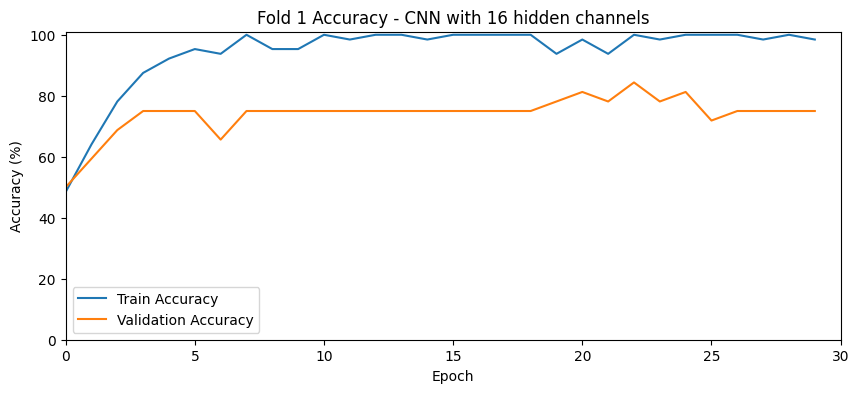

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 51.56% | Val Acc: 62.50% | Val Loss: 1.2701
Fold 2 | Epoch 2/30 | Train Acc: 81.25% | Val Acc: 59.38% | Val Loss: 1.2291
Fold 2 | Epoch 3/30 | Train Acc: 87.50% | Val Acc: 71.88% | Val Loss: 1.1707
Fold 2 | Epoch 4/30 | Train Acc: 92.19% | Val Acc: 68.75% | Val Loss: 1.1815
Fold 2 | Epoch 5/30 | Train Acc: 90.62% | Val Acc: 50.00% | Val Loss: 1.1957
Fold 2 | Epoch 6/30 | Train Acc: 92.19% | Val Acc: 50.00% | Val Loss: 1.1832
Fold 2 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 50.00% | Val Loss: 1.1825
Fold 2 | Epoch 8/30 | Train Acc: 93.75% | Val Acc: 56.25% | Val Loss: 1.0535
Fold 2 | Epoch 9/30 | Train Acc: 100.00% | Val Acc: 62.50% | Val Loss: 0.9863
Fold 2 | Epoch 10/30 | Train Acc: 93.75% | Val Acc: 59.38% | Val Loss: 0.9688
Fold 2 | Epoch 11/30 | Train Acc: 95.31% | Val Acc: 53.12% | Val Loss: 0.9086
Fold 2 | Epoch 12/30 | Train Acc: 98.44% | Val Acc: 56.25% | Val Loss: 0.8673
Fold 2 

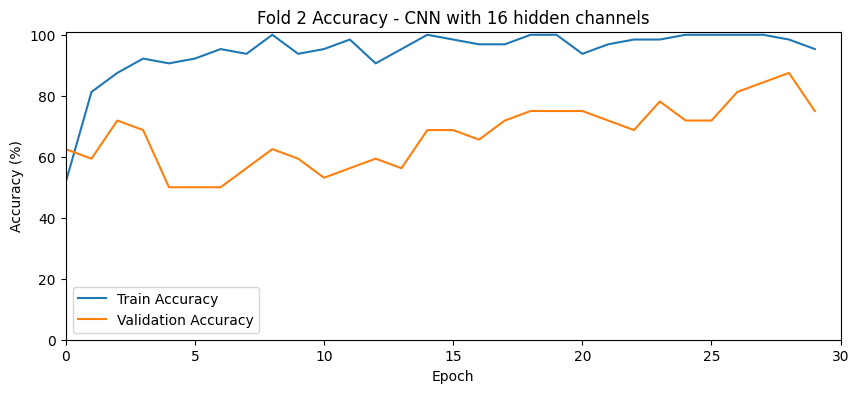

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 45.31% | Val Acc: 53.12% | Val Loss: 1.2491
Fold 3 | Epoch 2/30 | Train Acc: 68.75% | Val Acc: 53.12% | Val Loss: 1.1747
Fold 3 | Epoch 3/30 | Train Acc: 81.25% | Val Acc: 50.00% | Val Loss: 1.0806
Fold 3 | Epoch 4/30 | Train Acc: 90.62% | Val Acc: 59.38% | Val Loss: 1.0044
Fold 3 | Epoch 5/30 | Train Acc: 93.75% | Val Acc: 68.75% | Val Loss: 0.8894
Fold 3 | Epoch 6/30 | Train Acc: 96.88% | Val Acc: 78.12% | Val Loss: 0.7579
Fold 3 | Epoch 7/30 | Train Acc: 92.19% | Val Acc: 84.38% | Val Loss: 0.6612
Fold 3 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 93.75% | Val Loss: 0.5556
Fold 3 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 93.75% | Val Loss: 0.5753
Fold 3 | Epoch 10/30 | Train Acc: 100.00% | Val Acc: 93.75% | Val Loss: 0.6074
Fold 3 | Epoch 11/30 | Train Acc: 93.75% | Val Acc: 100.00% | Val Loss: 0.4116
Fold 3 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 100.00% | Val Loss: 0.4024
Fold

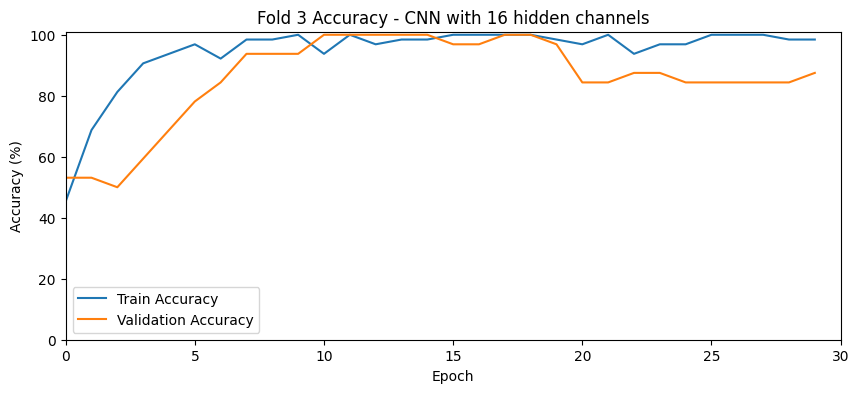

Mean person-level validation accuracy: 77.08%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 60.94% | Val Acc: 53.12% | Val Loss: 1.0641
Fold 1 | Epoch 2/30 | Train Acc: 81.25% | Val Acc: 53.12% | Val Loss: 0.9868
Fold 1 | Epoch 3/30 | Train Acc: 90.62% | Val Acc: 59.38% | Val Loss: 0.9414
Fold 1 | Epoch 4/30 | Train Acc: 76.56% | Val Acc: 75.00% | Val Loss: 0.8578
Fold 1 | Epoch 5/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.8412
Fold 1 | Epoch 6/30 | Train Acc: 93.75% | Val Acc: 75.00% | Val Loss: 0.8061
Fold 1 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.7836
Fold 1 | Epoch 8/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.7897
Fold 1 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 78.12% | Val Loss: 0.7702
Fold 1 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.7283
Fold 1 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 71.88% | Val Loss: 0.7357
Fold 1 | Epoch 12/30 | Train Acc: 100.00

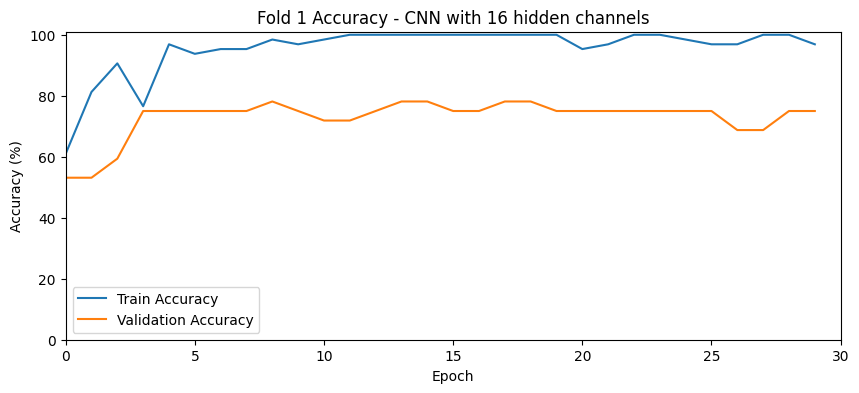

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 54.69% | Val Acc: 28.12% | Val Loss: 1.3100
Fold 2 | Epoch 2/30 | Train Acc: 85.94% | Val Acc: 65.62% | Val Loss: 1.2477
Fold 2 | Epoch 3/30 | Train Acc: 81.25% | Val Acc: 46.88% | Val Loss: 1.2115
Fold 2 | Epoch 4/30 | Train Acc: 81.25% | Val Acc: 40.62% | Val Loss: 1.2264
Fold 2 | Epoch 5/30 | Train Acc: 92.19% | Val Acc: 43.75% | Val Loss: 1.1955
Fold 2 | Epoch 6/30 | Train Acc: 95.31% | Val Acc: 59.38% | Val Loss: 1.1367
Fold 2 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 59.38% | Val Loss: 1.0845
Fold 2 | Epoch 8/30 | Train Acc: 96.88% | Val Acc: 59.38% | Val Loss: 1.0268
Fold 2 | Epoch 9/30 | Train Acc: 95.31% | Val Acc: 59.38% | Val Loss: 1.0157
Fold 2 | Epoch 10/30 | Train Acc: 93.75% | Val Acc: 56.25% | Val Loss: 1.0314
Fold 2 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 59.38% | Val Loss: 0.9945
Fold 2 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 62.50% | Val Loss: 0.9900
Fold 2 

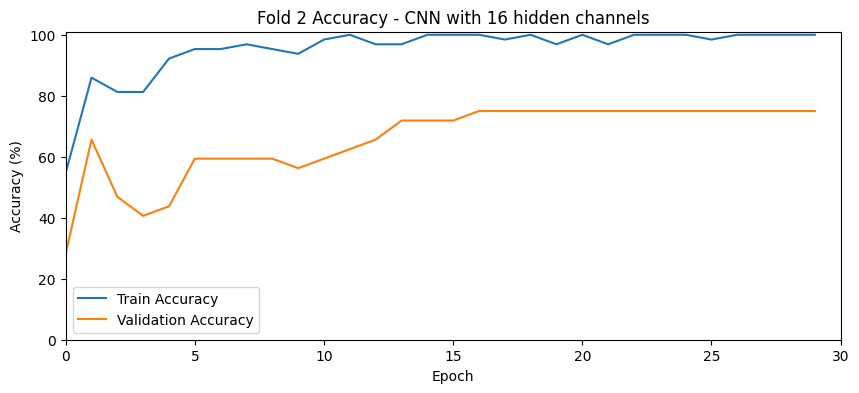

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 53.12% | Val Acc: 50.00% | Val Loss: 0.9754
Fold 3 | Epoch 2/30 | Train Acc: 76.56% | Val Acc: 68.75% | Val Loss: 0.9391
Fold 3 | Epoch 3/30 | Train Acc: 81.25% | Val Acc: 53.12% | Val Loss: 0.9276
Fold 3 | Epoch 4/30 | Train Acc: 92.19% | Val Acc: 50.00% | Val Loss: 0.9598
Fold 3 | Epoch 5/30 | Train Acc: 92.19% | Val Acc: 59.38% | Val Loss: 0.8323
Fold 3 | Epoch 6/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.7317
Fold 3 | Epoch 7/30 | Train Acc: 98.44% | Val Acc: 84.38% | Val Loss: 0.6814
Fold 3 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 87.50% | Val Loss: 0.6135
Fold 3 | Epoch 9/30 | Train Acc: 95.31% | Val Acc: 96.88% | Val Loss: 0.4938
Fold 3 | Epoch 10/30 | Train Acc: 93.75% | Val Acc: 96.88% | Val Loss: 0.4267
Fold 3 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 100.00% | Val Loss: 0.4117
Fold 3 | Epoch 12/30 | Train Acc: 96.88% | Val Acc: 90.62% | Val Loss: 0.5171
Fold 3 

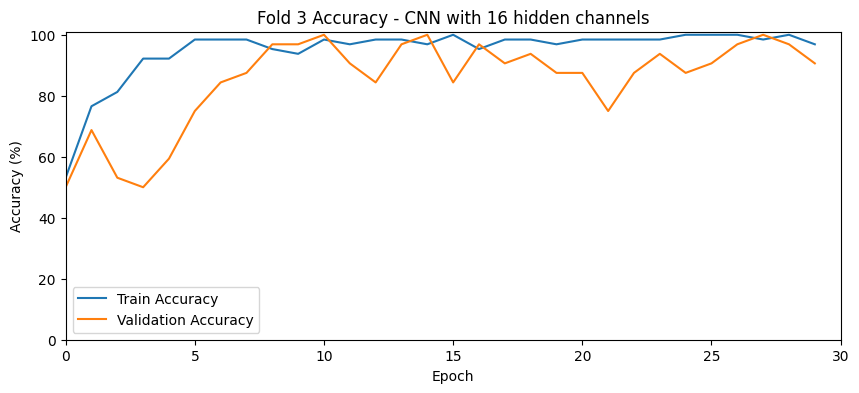

Mean person-level validation accuracy: 80.21%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 48.44% | Val Acc: 28.12% | Val Loss: 1.2466
Fold 1 | Epoch 2/30 | Train Acc: 68.75% | Val Acc: 34.38% | Val Loss: 1.2777
Fold 1 | Epoch 3/30 | Train Acc: 75.00% | Val Acc: 34.38% | Val Loss: 1.2928
Fold 1 | Epoch 4/30 | Train Acc: 90.62% | Val Acc: 34.38% | Val Loss: 1.2388
Fold 1 | Epoch 5/30 | Train Acc: 89.06% | Val Acc: 34.38% | Val Loss: 1.1738
Fold 1 | Epoch 6/30 | Train Acc: 85.94% | Val Acc: 43.75% | Val Loss: 1.1332
Fold 1 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 50.00% | Val Loss: 1.1488
Fold 1 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 46.88% | Val Loss: 1.0831
Fold 1 | Epoch 9/30 | Train Acc: 95.31% | Val Acc: 40.62% | Val Loss: 1.0184
Fold 1 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 50.00% | Val Loss: 1.0208
Fold 1 | Epoch 11/30 | Train Acc: 96.88% | Val Acc: 53.12% | Val Loss: 1.0472
Fold 1 | Epoch 12/30 | Train Acc: 96.88%

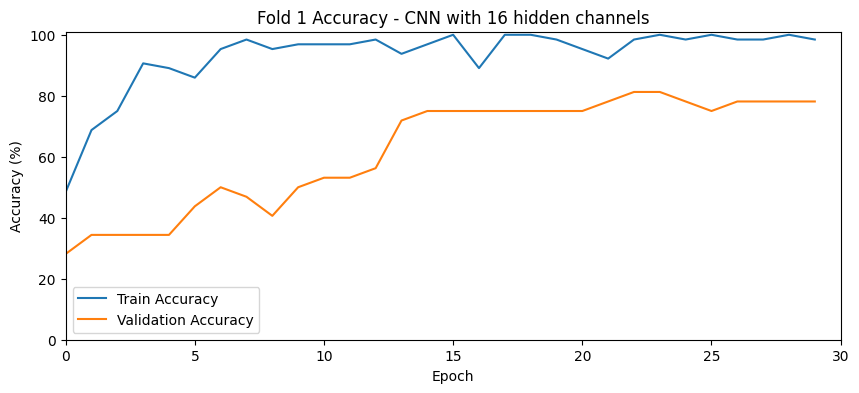

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 56.25% | Val Acc: 43.75% | Val Loss: 1.2068
Fold 2 | Epoch 2/30 | Train Acc: 78.12% | Val Acc: 68.75% | Val Loss: 1.1389
Fold 2 | Epoch 3/30 | Train Acc: 85.94% | Val Acc: 75.00% | Val Loss: 1.0871
Fold 2 | Epoch 4/30 | Train Acc: 93.75% | Val Acc: 68.75% | Val Loss: 1.0219
Fold 2 | Epoch 5/30 | Train Acc: 96.88% | Val Acc: 62.50% | Val Loss: 0.9643
Fold 2 | Epoch 6/30 | Train Acc: 92.19% | Val Acc: 62.50% | Val Loss: 0.9194
Fold 2 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 59.38% | Val Loss: 0.9156
Fold 2 | Epoch 8/30 | Train Acc: 95.31% | Val Acc: 53.12% | Val Loss: 0.9105
Fold 2 | Epoch 9/30 | Train Acc: 95.31% | Val Acc: 71.88% | Val Loss: 0.8343
Fold 2 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.7608
Fold 2 | Epoch 11/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.7206
Fold 2 | Epoch 12/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.7622
Fold 2 |

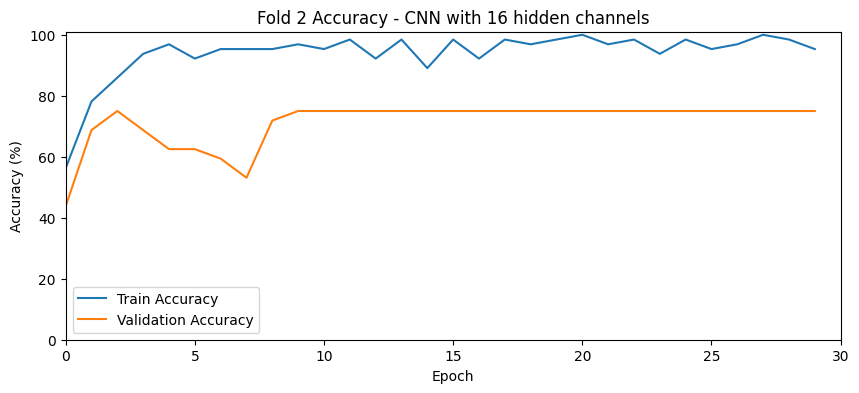

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 43.75% | Val Acc: 50.00% | Val Loss: 1.1747
Fold 3 | Epoch 2/30 | Train Acc: 70.31% | Val Acc: 50.00% | Val Loss: 1.0976
Fold 3 | Epoch 3/30 | Train Acc: 73.44% | Val Acc: 59.38% | Val Loss: 0.9985
Fold 3 | Epoch 4/30 | Train Acc: 92.19% | Val Acc: 62.50% | Val Loss: 0.9043
Fold 3 | Epoch 5/30 | Train Acc: 87.50% | Val Acc: 90.62% | Val Loss: 0.7904
Fold 3 | Epoch 6/30 | Train Acc: 87.50% | Val Acc: 93.75% | Val Loss: 0.6740
Fold 3 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 93.75% | Val Loss: 0.6813
Fold 3 | Epoch 8/30 | Train Acc: 93.75% | Val Acc: 100.00% | Val Loss: 0.6156
Fold 3 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 100.00% | Val Loss: 0.5918
Fold 3 | Epoch 10/30 | Train Acc: 93.75% | Val Acc: 90.62% | Val Loss: 0.6056
Fold 3 | Epoch 11/30 | Train Acc: 96.88% | Val Acc: 96.88% | Val Loss: 0.5156
Fold 3 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 100.00% | Val Loss: 0.4304
Fold

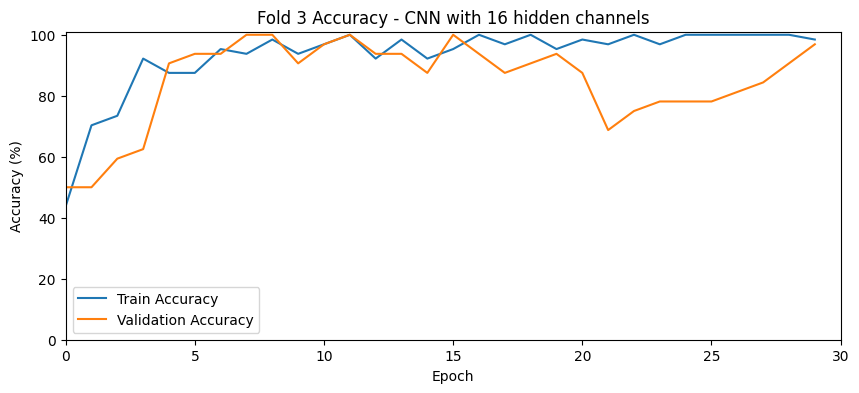

Mean person-level validation accuracy: 78.12%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 48.44% | Val Acc: 43.75% | Val Loss: 1.1134
Fold 1 | Epoch 2/30 | Train Acc: 78.12% | Val Acc: 43.75% | Val Loss: 1.0782
Fold 1 | Epoch 3/30 | Train Acc: 87.50% | Val Acc: 40.62% | Val Loss: 1.0197
Fold 1 | Epoch 4/30 | Train Acc: 89.06% | Val Acc: 53.12% | Val Loss: 0.9645
Fold 1 | Epoch 5/30 | Train Acc: 96.88% | Val Acc: 62.50% | Val Loss: 0.9485
Fold 1 | Epoch 6/30 | Train Acc: 98.44% | Val Acc: 65.62% | Val Loss: 0.9047
Fold 1 | Epoch 7/30 | Train Acc: 90.62% | Val Acc: 75.00% | Val Loss: 0.8397
Fold 1 | Epoch 8/30 | Train Acc: 96.88% | Val Acc: 65.62% | Val Loss: 0.8537
Fold 1 | Epoch 9/30 | Train Acc: 96.88% | Val Acc: 71.88% | Val Loss: 0.7817
Fold 1 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.7481
Fold 1 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 78.12% | Val Loss: 0.7285
Fold 1 | Epoch 12/30 | Train Acc: 95.31%

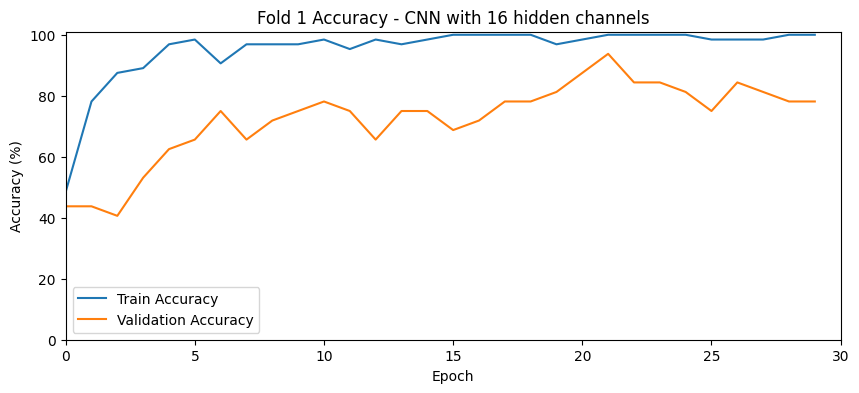

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 35.94% | Val Acc: 46.88% | Val Loss: 1.2672
Fold 2 | Epoch 2/30 | Train Acc: 62.50% | Val Acc: 50.00% | Val Loss: 1.2080
Fold 2 | Epoch 3/30 | Train Acc: 75.00% | Val Acc: 59.38% | Val Loss: 1.0690
Fold 2 | Epoch 4/30 | Train Acc: 81.25% | Val Acc: 56.25% | Val Loss: 1.0353
Fold 2 | Epoch 5/30 | Train Acc: 84.38% | Val Acc: 59.38% | Val Loss: 0.9650
Fold 2 | Epoch 6/30 | Train Acc: 93.75% | Val Acc: 62.50% | Val Loss: 0.9331
Fold 2 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 59.38% | Val Loss: 0.9219
Fold 2 | Epoch 8/30 | Train Acc: 95.31% | Val Acc: 62.50% | Val Loss: 0.8816
Fold 2 | Epoch 9/30 | Train Acc: 93.75% | Val Acc: 68.75% | Val Loss: 0.8712
Fold 2 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 71.88% | Val Loss: 0.8590
Fold 2 | Epoch 11/30 | Train Acc: 95.31% | Val Acc: 71.88% | Val Loss: 0.8647
Fold 2 | Epoch 12/30 | Train Acc: 98.44% | Val Acc: 71.88% | Val Loss: 0.8701
Fold 2 |

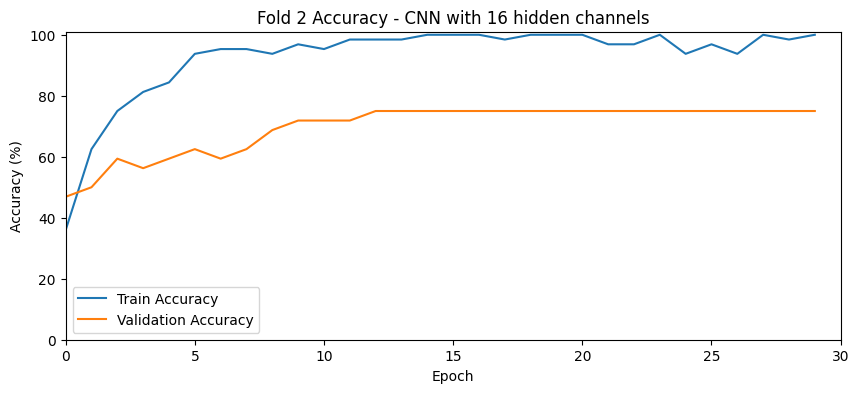

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 46.88% | Val Acc: 68.75% | Val Loss: 1.1307
Fold 3 | Epoch 2/30 | Train Acc: 75.00% | Val Acc: 71.88% | Val Loss: 1.0893
Fold 3 | Epoch 3/30 | Train Acc: 82.81% | Val Acc: 75.00% | Val Loss: 0.9754
Fold 3 | Epoch 4/30 | Train Acc: 95.31% | Val Acc: 78.12% | Val Loss: 0.9021
Fold 3 | Epoch 5/30 | Train Acc: 93.75% | Val Acc: 81.25% | Val Loss: 0.7617
Fold 3 | Epoch 6/30 | Train Acc: 92.19% | Val Acc: 81.25% | Val Loss: 0.6579
Fold 3 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 96.88% | Val Loss: 0.5683
Fold 3 | Epoch 8/30 | Train Acc: 96.88% | Val Acc: 100.00% | Val Loss: 0.5801
Fold 3 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 87.50% | Val Loss: 0.5884
Fold 3 | Epoch 10/30 | Train Acc: 100.00% | Val Acc: 84.38% | Val Loss: 0.6372
Fold 3 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 81.25% | Val Loss: 0.7311
Fold 3 | Epoch 12/30 | Train Acc: 93.75% | Val Acc: 100.00% | Val Loss: 0.4700
Fold 

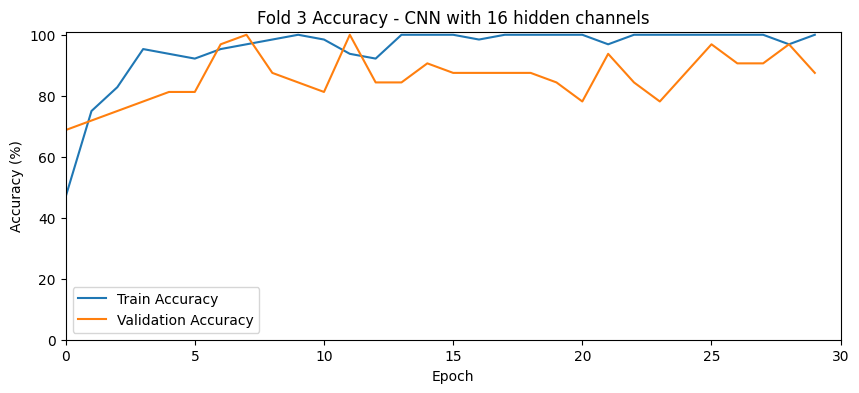

Mean person-level validation accuracy: 80.21%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 34.38% | Val Acc: 25.00% | Val Loss: 1.3231
Fold 1 | Epoch 2/30 | Train Acc: 68.75% | Val Acc: 50.00% | Val Loss: 1.3424
Fold 1 | Epoch 3/30 | Train Acc: 85.94% | Val Acc: 50.00% | Val Loss: 1.2974
Fold 1 | Epoch 4/30 | Train Acc: 84.38% | Val Acc: 37.50% | Val Loss: 1.2826
Fold 1 | Epoch 5/30 | Train Acc: 90.62% | Val Acc: 34.38% | Val Loss: 1.2522
Fold 1 | Epoch 6/30 | Train Acc: 100.00% | Val Acc: 50.00% | Val Loss: 1.1483
Fold 1 | Epoch 7/30 | Train Acc: 90.62% | Val Acc: 50.00% | Val Loss: 1.0273
Fold 1 | Epoch 8/30 | Train Acc: 92.19% | Val Acc: 53.12% | Val Loss: 0.9357
Fold 1 | Epoch 9/30 | Train Acc: 95.31% | Val Acc: 53.12% | Val Loss: 0.9846
Fold 1 | Epoch 10/30 | Train Acc: 95.31% | Val Acc: 71.88% | Val Loss: 0.8377
Fold 1 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 68.75% | Val Loss: 0.9043
Fold 1 | Epoch 12/30 | Train Acc: 93.75

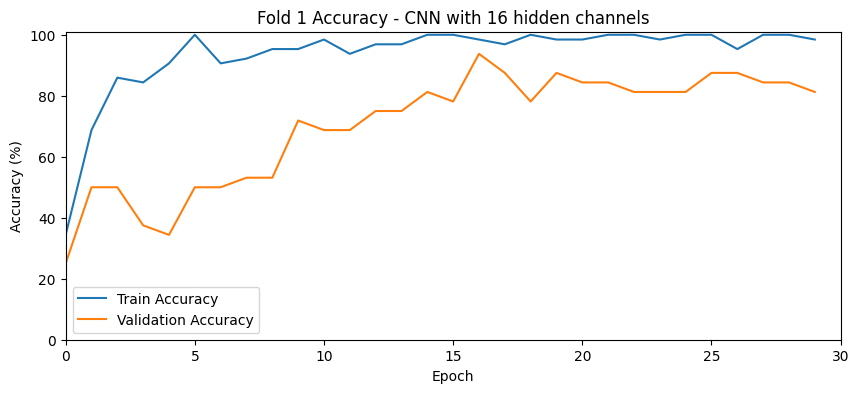

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 67.19% | Val Acc: 46.88% | Val Loss: 1.3323
Fold 2 | Epoch 2/30 | Train Acc: 84.38% | Val Acc: 50.00% | Val Loss: 1.2728
Fold 2 | Epoch 3/30 | Train Acc: 98.44% | Val Acc: 56.25% | Val Loss: 1.2250
Fold 2 | Epoch 4/30 | Train Acc: 95.31% | Val Acc: 65.62% | Val Loss: 1.1637
Fold 2 | Epoch 5/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 1.1076
Fold 2 | Epoch 6/30 | Train Acc: 100.00% | Val Acc: 59.38% | Val Loss: 1.0605
Fold 2 | Epoch 7/30 | Train Acc: 96.88% | Val Acc: 56.25% | Val Loss: 1.0188
Fold 2 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 62.50% | Val Loss: 0.9136
Fold 2 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 65.62% | Val Loss: 0.8699
Fold 2 | Epoch 10/30 | Train Acc: 98.44% | Val Acc: 78.12% | Val Loss: 0.7952
Fold 2 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 81.25% | Val Loss: 0.7464
Fold 2 | Epoch 12/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.8316
Fold 2 

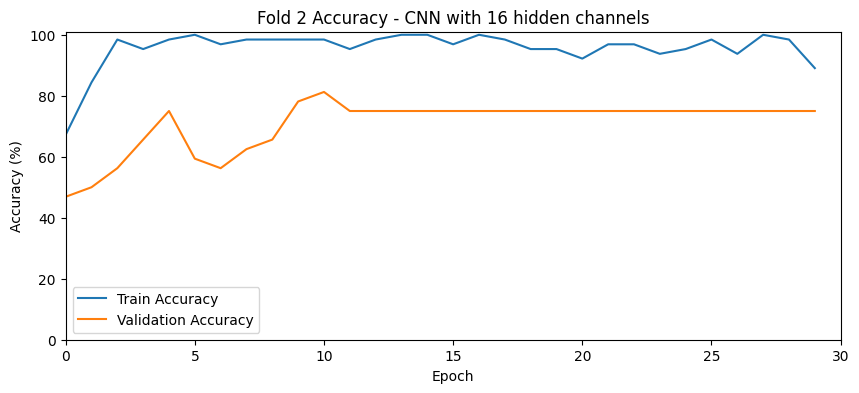

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 56.25% | Val Acc: 56.25% | Val Loss: 1.1771
Fold 3 | Epoch 2/30 | Train Acc: 76.56% | Val Acc: 50.00% | Val Loss: 1.0947
Fold 3 | Epoch 3/30 | Train Acc: 96.88% | Val Acc: 53.12% | Val Loss: 0.9938
Fold 3 | Epoch 4/30 | Train Acc: 95.31% | Val Acc: 65.62% | Val Loss: 0.8778
Fold 3 | Epoch 5/30 | Train Acc: 95.31% | Val Acc: 90.62% | Val Loss: 0.6683
Fold 3 | Epoch 6/30 | Train Acc: 98.44% | Val Acc: 87.50% | Val Loss: 0.5862
Fold 3 | Epoch 7/30 | Train Acc: 100.00% | Val Acc: 90.62% | Val Loss: 0.5570
Fold 3 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 96.88% | Val Loss: 0.4785
Fold 3 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 87.50% | Val Loss: 0.6086
Fold 3 | Epoch 10/30 | Train Acc: 93.75% | Val Acc: 81.25% | Val Loss: 0.6877
Fold 3 | Epoch 11/30 | Train Acc: 92.19% | Val Acc: 90.62% | Val Loss: 0.4940
Fold 3 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 93.75% | Val Loss: 0.3856
Fold 3

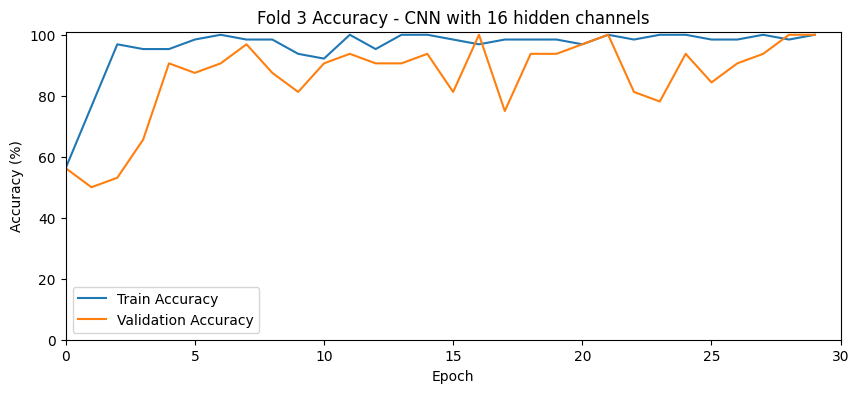

Mean person-level validation accuracy: 79.17%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 57.81% | Val Acc: 31.25% | Val Loss: 1.0901
Fold 1 | Epoch 2/30 | Train Acc: 84.38% | Val Acc: 40.62% | Val Loss: 1.0091
Fold 1 | Epoch 3/30 | Train Acc: 84.38% | Val Acc: 59.38% | Val Loss: 0.9644
Fold 1 | Epoch 4/30 | Train Acc: 93.75% | Val Acc: 68.75% | Val Loss: 0.9549
Fold 1 | Epoch 5/30 | Train Acc: 93.75% | Val Acc: 75.00% | Val Loss: 0.8938
Fold 1 | Epoch 6/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.8545
Fold 1 | Epoch 7/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.8433
Fold 1 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.8277
Fold 1 | Epoch 9/30 | Train Acc: 92.19% | Val Acc: 75.00% | Val Loss: 0.7925
Fold 1 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.6720
Fold 1 | Epoch 11/30 | Train Acc: 100.00% | Val Acc: 78.12% | Val Loss: 0.5846
Fold 1 | Epoch 12/30 | Train Acc: 93.75

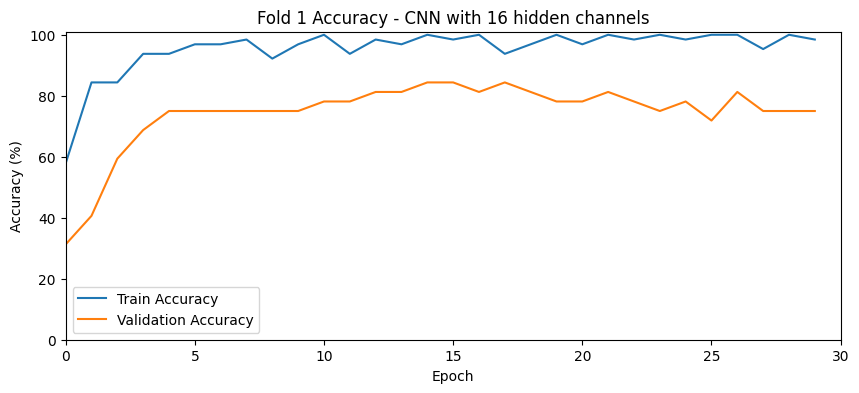

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 56.25% | Val Acc: 31.25% | Val Loss: 1.2918
Fold 2 | Epoch 2/30 | Train Acc: 68.75% | Val Acc: 34.38% | Val Loss: 1.2522
Fold 2 | Epoch 3/30 | Train Acc: 82.81% | Val Acc: 43.75% | Val Loss: 1.2073
Fold 2 | Epoch 4/30 | Train Acc: 96.88% | Val Acc: 53.12% | Val Loss: 1.1529
Fold 2 | Epoch 5/30 | Train Acc: 98.44% | Val Acc: 59.38% | Val Loss: 1.1145
Fold 2 | Epoch 6/30 | Train Acc: 95.31% | Val Acc: 65.62% | Val Loss: 1.0817
Fold 2 | Epoch 7/30 | Train Acc: 96.88% | Val Acc: 68.75% | Val Loss: 1.0616
Fold 2 | Epoch 8/30 | Train Acc: 93.75% | Val Acc: 71.88% | Val Loss: 0.9568
Fold 2 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 68.75% | Val Loss: 0.9557
Fold 2 | Epoch 10/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.9513
Fold 2 | Epoch 11/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.9042
Fold 2 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.8855
Fold 2

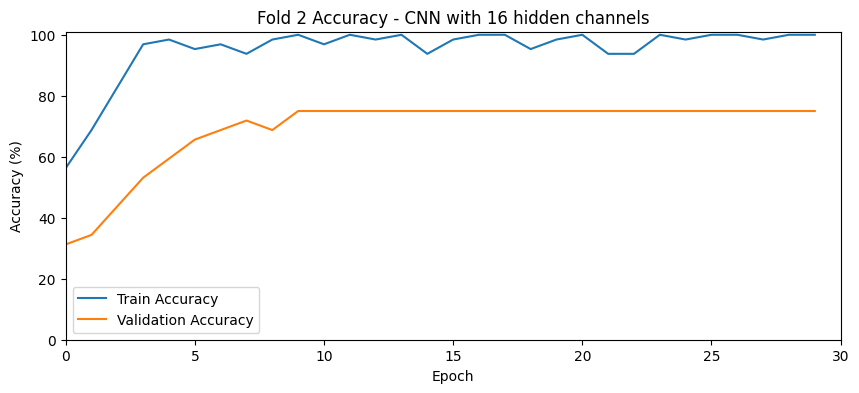

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 57.81% | Val Acc: 62.50% | Val Loss: 1.2359
Fold 3 | Epoch 2/30 | Train Acc: 68.75% | Val Acc: 56.25% | Val Loss: 1.1697
Fold 3 | Epoch 3/30 | Train Acc: 79.69% | Val Acc: 68.75% | Val Loss: 1.0437
Fold 3 | Epoch 4/30 | Train Acc: 84.38% | Val Acc: 71.88% | Val Loss: 0.8273
Fold 3 | Epoch 5/30 | Train Acc: 87.50% | Val Acc: 96.88% | Val Loss: 0.7119
Fold 3 | Epoch 6/30 | Train Acc: 92.19% | Val Acc: 78.12% | Val Loss: 0.7807
Fold 3 | Epoch 7/30 | Train Acc: 96.88% | Val Acc: 84.38% | Val Loss: 0.6489
Fold 3 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 96.88% | Val Loss: 0.5301
Fold 3 | Epoch 9/30 | Train Acc: 100.00% | Val Acc: 96.88% | Val Loss: 0.5201
Fold 3 | Epoch 10/30 | Train Acc: 95.31% | Val Acc: 93.75% | Val Loss: 0.5272
Fold 3 | Epoch 11/30 | Train Acc: 100.00% | Val Acc: 81.25% | Val Loss: 0.5859
Fold 3 | Epoch 12/30 | Train Acc: 96.88% | Val Acc: 100.00% | Val Loss: 0.3418
Fold 

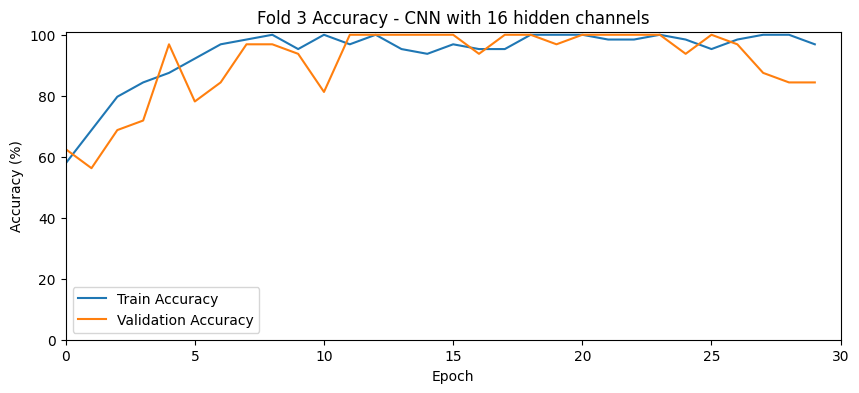

Mean person-level validation accuracy: 78.12%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 54.69% | Val Acc: 53.12% | Val Loss: 1.1145
Fold 1 | Epoch 2/30 | Train Acc: 68.75% | Val Acc: 50.00% | Val Loss: 1.0550
Fold 1 | Epoch 3/30 | Train Acc: 89.06% | Val Acc: 53.12% | Val Loss: 1.0633
Fold 1 | Epoch 4/30 | Train Acc: 93.75% | Val Acc: 59.38% | Val Loss: 1.0424
Fold 1 | Epoch 5/30 | Train Acc: 98.44% | Val Acc: 62.50% | Val Loss: 0.9941
Fold 1 | Epoch 6/30 | Train Acc: 95.31% | Val Acc: 68.75% | Val Loss: 0.9099
Fold 1 | Epoch 7/30 | Train Acc: 93.75% | Val Acc: 75.00% | Val Loss: 0.8766
Fold 1 | Epoch 8/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.8094
Fold 1 | Epoch 9/30 | Train Acc: 93.75% | Val Acc: 65.62% | Val Loss: 0.7708
Fold 1 | Epoch 10/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.7405
Fold 1 | Epoch 11/30 | Train Acc: 96.88% | Val Acc: 78.12% | Val Loss: 0.7330
Fold 1 | Epoch 12/30 | Train Acc: 100.0

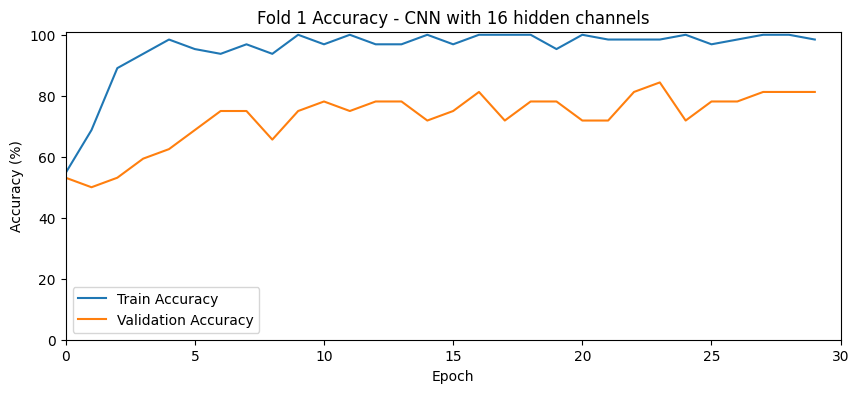

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 50.00% | Val Acc: 46.88% | Val Loss: 1.2273
Fold 2 | Epoch 2/30 | Train Acc: 65.62% | Val Acc: 65.62% | Val Loss: 1.1435
Fold 2 | Epoch 3/30 | Train Acc: 84.38% | Val Acc: 84.38% | Val Loss: 1.0605
Fold 2 | Epoch 4/30 | Train Acc: 84.38% | Val Acc: 75.00% | Val Loss: 0.9775
Fold 2 | Epoch 5/30 | Train Acc: 96.88% | Val Acc: 71.88% | Val Loss: 0.9429
Fold 2 | Epoch 6/30 | Train Acc: 89.06% | Val Acc: 62.50% | Val Loss: 0.9065
Fold 2 | Epoch 7/30 | Train Acc: 93.75% | Val Acc: 68.75% | Val Loss: 0.8849
Fold 2 | Epoch 8/30 | Train Acc: 85.94% | Val Acc: 62.50% | Val Loss: 0.9098
Fold 2 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 65.62% | Val Loss: 0.8575
Fold 2 | Epoch 10/30 | Train Acc: 98.44% | Val Acc: 59.38% | Val Loss: 0.8088
Fold 2 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 65.62% | Val Loss: 0.8130
Fold 2 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 71.88% | Val Loss: 0.7873
Fold 2 

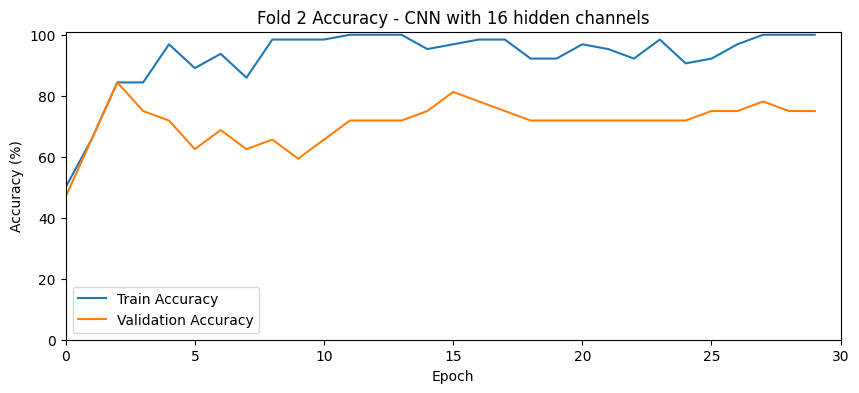

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 50.00% | Val Acc: 25.00% | Val Loss: 1.2308
Fold 3 | Epoch 2/30 | Train Acc: 71.88% | Val Acc: 56.25% | Val Loss: 1.1090
Fold 3 | Epoch 3/30 | Train Acc: 87.50% | Val Acc: 78.12% | Val Loss: 0.9512
Fold 3 | Epoch 4/30 | Train Acc: 89.06% | Val Acc: 87.50% | Val Loss: 0.8147
Fold 3 | Epoch 5/30 | Train Acc: 96.88% | Val Acc: 84.38% | Val Loss: 0.7930
Fold 3 | Epoch 6/30 | Train Acc: 95.31% | Val Acc: 90.62% | Val Loss: 0.7498
Fold 3 | Epoch 7/30 | Train Acc: 89.06% | Val Acc: 93.75% | Val Loss: 0.6781
Fold 3 | Epoch 8/30 | Train Acc: 96.88% | Val Acc: 93.75% | Val Loss: 0.5845
Fold 3 | Epoch 9/30 | Train Acc: 90.62% | Val Acc: 90.62% | Val Loss: 0.6285
Fold 3 | Epoch 10/30 | Train Acc: 98.44% | Val Acc: 90.62% | Val Loss: 0.5403
Fold 3 | Epoch 11/30 | Train Acc: 98.44% | Val Acc: 90.62% | Val Loss: 0.5099
Fold 3 | Epoch 12/30 | Train Acc: 98.44% | Val Acc: 93.75% | Val Loss: 0.4414
Fold 3 |

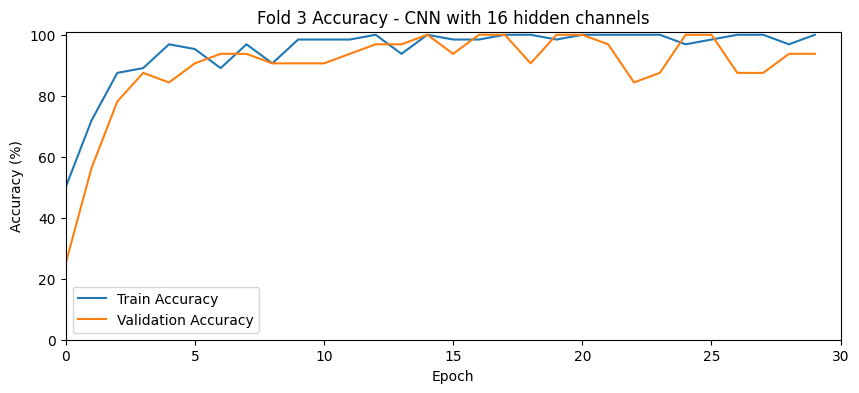

Mean person-level validation accuracy: 84.38%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 57.81% | Val Acc: 65.62% | Val Loss: 1.1817
Fold 1 | Epoch 2/30 | Train Acc: 84.38% | Val Acc: 56.25% | Val Loss: 1.1104
Fold 1 | Epoch 3/30 | Train Acc: 92.19% | Val Acc: 65.62% | Val Loss: 1.0825
Fold 1 | Epoch 4/30 | Train Acc: 89.06% | Val Acc: 53.12% | Val Loss: 1.0320
Fold 1 | Epoch 5/30 | Train Acc: 92.19% | Val Acc: 56.25% | Val Loss: 0.9447
Fold 1 | Epoch 6/30 | Train Acc: 89.06% | Val Acc: 59.38% | Val Loss: 0.8783
Fold 1 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.8154
Fold 1 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.7781
Fold 1 | Epoch 9/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.7233
Fold 1 | Epoch 10/30 | Train Acc: 100.00% | Val Acc: 68.75% | Val Loss: 0.7115
Fold 1 | Epoch 11/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.6541
Fold 1 | Epoch 12/30 | Train Acc: 95.31

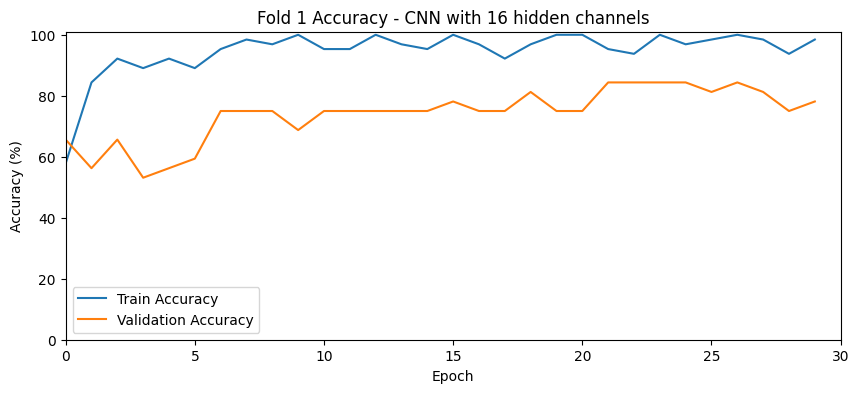

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 60.94% | Val Acc: 75.00% | Val Loss: 1.2409
Fold 2 | Epoch 2/30 | Train Acc: 76.56% | Val Acc: 71.88% | Val Loss: 1.1635
Fold 2 | Epoch 3/30 | Train Acc: 93.75% | Val Acc: 71.88% | Val Loss: 1.0992
Fold 2 | Epoch 4/30 | Train Acc: 90.62% | Val Acc: 75.00% | Val Loss: 1.0400
Fold 2 | Epoch 5/30 | Train Acc: 93.75% | Val Acc: 71.88% | Val Loss: 0.9907
Fold 2 | Epoch 6/30 | Train Acc: 96.88% | Val Acc: 68.75% | Val Loss: 0.9859
Fold 2 | Epoch 7/30 | Train Acc: 93.75% | Val Acc: 71.88% | Val Loss: 0.9411
Fold 2 | Epoch 8/30 | Train Acc: 93.75% | Val Acc: 71.88% | Val Loss: 0.8856
Fold 2 | Epoch 9/30 | Train Acc: 93.75% | Val Acc: 75.00% | Val Loss: 0.8243
Fold 2 | Epoch 10/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.8686
Fold 2 | Epoch 11/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.8065
Fold 2 | Epoch 12/30 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.7623
Fold 2 

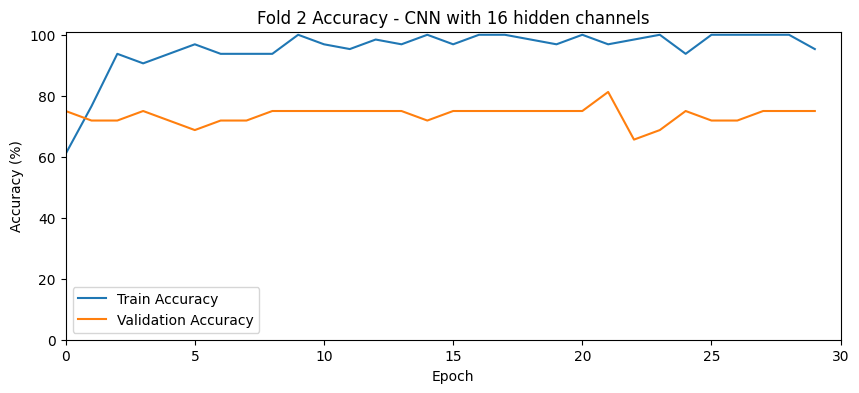

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 46.88% | Val Acc: 46.88% | Val Loss: 1.1988
Fold 3 | Epoch 2/30 | Train Acc: 67.19% | Val Acc: 75.00% | Val Loss: 1.0333
Fold 3 | Epoch 3/30 | Train Acc: 81.25% | Val Acc: 75.00% | Val Loss: 0.9343
Fold 3 | Epoch 4/30 | Train Acc: 82.81% | Val Acc: 71.88% | Val Loss: 0.8624
Fold 3 | Epoch 5/30 | Train Acc: 85.94% | Val Acc: 90.62% | Val Loss: 0.7809
Fold 3 | Epoch 6/30 | Train Acc: 84.38% | Val Acc: 84.38% | Val Loss: 0.7512
Fold 3 | Epoch 7/30 | Train Acc: 96.88% | Val Acc: 87.50% | Val Loss: 0.7151
Fold 3 | Epoch 8/30 | Train Acc: 92.19% | Val Acc: 100.00% | Val Loss: 0.6027
Fold 3 | Epoch 9/30 | Train Acc: 96.88% | Val Acc: 100.00% | Val Loss: 0.6850
Fold 3 | Epoch 10/30 | Train Acc: 95.31% | Val Acc: 90.62% | Val Loss: 0.7752
Fold 3 | Epoch 11/30 | Train Acc: 95.31% | Val Acc: 96.88% | Val Loss: 0.5242
Fold 3 | Epoch 12/30 | Train Acc: 98.44% | Val Acc: 100.00% | Val Loss: 0.5172
Fold 

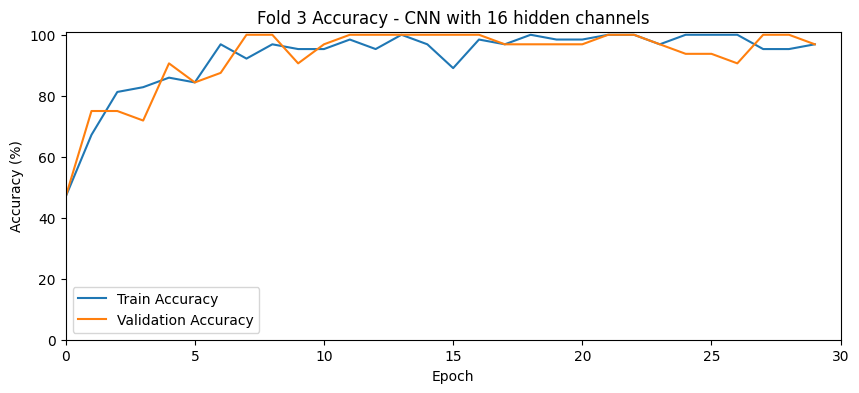

Mean person-level validation accuracy: 82.29%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 37.50% | Val Acc: 56.25% | Val Loss: 1.1345
Fold 1 | Epoch 2/30 | Train Acc: 68.75% | Val Acc: 56.25% | Val Loss: 1.0210
Fold 1 | Epoch 3/30 | Train Acc: 84.38% | Val Acc: 59.38% | Val Loss: 0.9622
Fold 1 | Epoch 4/30 | Train Acc: 92.19% | Val Acc: 46.88% | Val Loss: 0.9361
Fold 1 | Epoch 5/30 | Train Acc: 89.06% | Val Acc: 53.12% | Val Loss: 0.9182
Fold 1 | Epoch 6/30 | Train Acc: 93.75% | Val Acc: 53.12% | Val Loss: 0.8739
Fold 1 | Epoch 7/30 | Train Acc: 93.75% | Val Acc: 75.00% | Val Loss: 0.7883
Fold 1 | Epoch 8/30 | Train Acc: 95.31% | Val Acc: 59.38% | Val Loss: 0.8128
Fold 1 | Epoch 9/30 | Train Acc: 100.00% | Val Acc: 62.50% | Val Loss: 0.7698
Fold 1 | Epoch 10/30 | Train Acc: 100.00% | Val Acc: 65.62% | Val Loss: 0.7500
Fold 1 | Epoch 11/30 | Train Acc: 95.31% | Val Acc: 71.88% | Val Loss: 0.6949
Fold 1 | Epoch 12/30 | Train Acc: 98.4

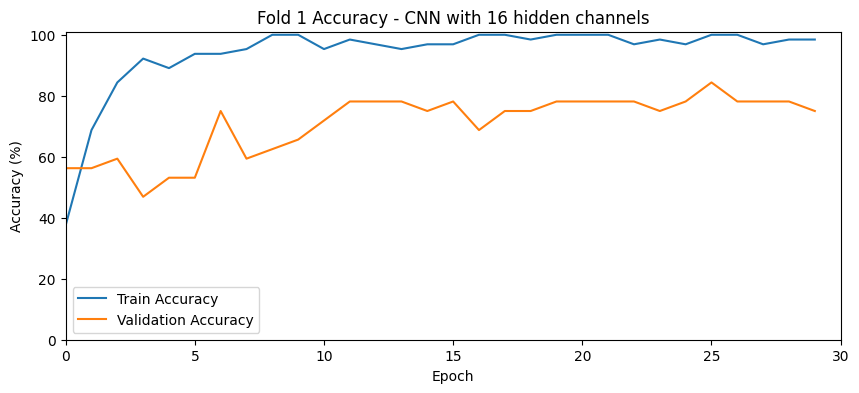

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 51.56% | Val Acc: 31.25% | Val Loss: 1.3716
Fold 2 | Epoch 2/30 | Train Acc: 73.44% | Val Acc: 25.00% | Val Loss: 1.3397
Fold 2 | Epoch 3/30 | Train Acc: 87.50% | Val Acc: 50.00% | Val Loss: 1.2731
Fold 2 | Epoch 4/30 | Train Acc: 92.19% | Val Acc: 50.00% | Val Loss: 1.2344
Fold 2 | Epoch 5/30 | Train Acc: 92.19% | Val Acc: 50.00% | Val Loss: 1.1515
Fold 2 | Epoch 6/30 | Train Acc: 98.44% | Val Acc: 56.25% | Val Loss: 1.0951
Fold 2 | Epoch 7/30 | Train Acc: 100.00% | Val Acc: 53.12% | Val Loss: 1.0896
Fold 2 | Epoch 8/30 | Train Acc: 95.31% | Val Acc: 53.12% | Val Loss: 1.1085
Fold 2 | Epoch 9/30 | Train Acc: 93.75% | Val Acc: 62.50% | Val Loss: 1.0780
Fold 2 | Epoch 10/30 | Train Acc: 98.44% | Val Acc: 62.50% | Val Loss: 0.9992
Fold 2 | Epoch 11/30 | Train Acc: 100.00% | Val Acc: 56.25% | Val Loss: 0.9732
Fold 2 | Epoch 12/30 | Train Acc: 95.31% | Val Acc: 53.12% | Val Loss: 1.0033
Fold 2

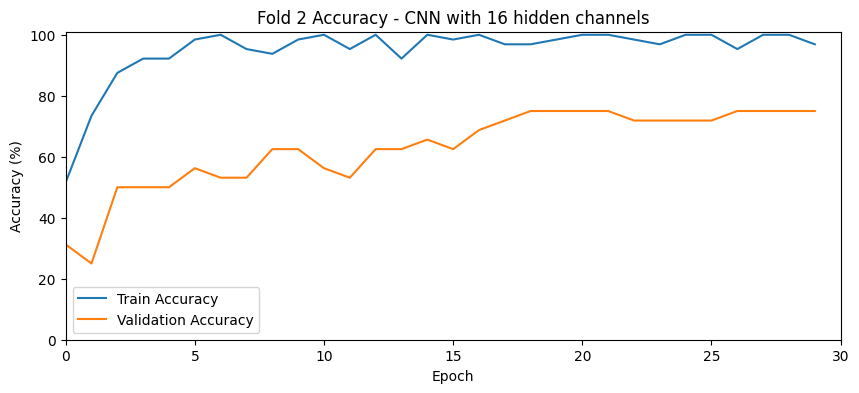

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 51.56% | Val Acc: 65.62% | Val Loss: 1.3223
Fold 3 | Epoch 2/30 | Train Acc: 81.25% | Val Acc: 53.12% | Val Loss: 1.2963
Fold 3 | Epoch 3/30 | Train Acc: 85.94% | Val Acc: 59.38% | Val Loss: 1.1036
Fold 3 | Epoch 4/30 | Train Acc: 84.38% | Val Acc: 84.38% | Val Loss: 0.8622
Fold 3 | Epoch 5/30 | Train Acc: 100.00% | Val Acc: 81.25% | Val Loss: 0.8361
Fold 3 | Epoch 6/30 | Train Acc: 95.31% | Val Acc: 90.62% | Val Loss: 0.6126
Fold 3 | Epoch 7/30 | Train Acc: 96.88% | Val Acc: 96.88% | Val Loss: 0.5543
Fold 3 | Epoch 8/30 | Train Acc: 96.88% | Val Acc: 96.88% | Val Loss: 0.5131
Fold 3 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 84.38% | Val Loss: 0.5695
Fold 3 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 90.62% | Val Loss: 0.5889
Fold 3 | Epoch 11/30 | Train Acc: 93.75% | Val Acc: 84.38% | Val Loss: 0.5761
Fold 3 | Epoch 12/30 | Train Acc: 98.44% | Val Acc: 96.88% | Val Loss: 0.4873
Fold 3 

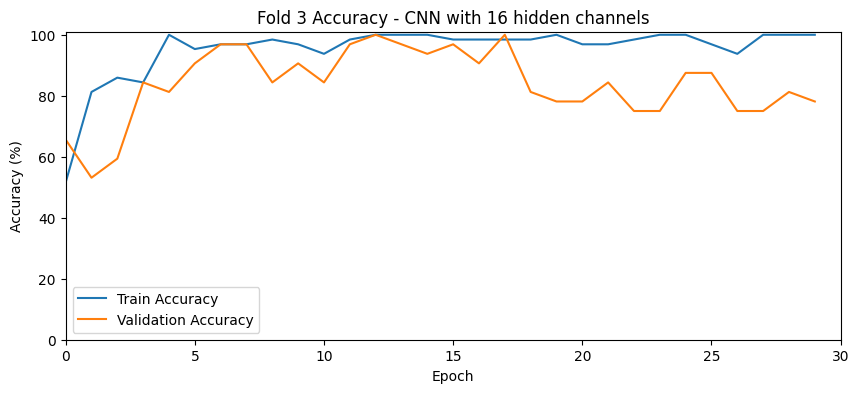

Mean person-level validation accuracy: 80.21%
Starting fold 1/3 | Test person: cross_113922 (person_id=113922)
Fold 1 | Epoch 1/30 | Train Acc: 56.25% | Val Acc: 56.25% | Val Loss: 1.2374
Fold 1 | Epoch 2/30 | Train Acc: 76.56% | Val Acc: 65.62% | Val Loss: 1.1574
Fold 1 | Epoch 3/30 | Train Acc: 82.81% | Val Acc: 75.00% | Val Loss: 1.0841
Fold 1 | Epoch 4/30 | Train Acc: 78.12% | Val Acc: 75.00% | Val Loss: 1.0518
Fold 1 | Epoch 5/30 | Train Acc: 87.50% | Val Acc: 75.00% | Val Loss: 1.0418
Fold 1 | Epoch 6/30 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 1.0216
Fold 1 | Epoch 7/30 | Train Acc: 100.00% | Val Acc: 71.88% | Val Loss: 0.9858
Fold 1 | Epoch 8/30 | Train Acc: 93.75% | Val Acc: 75.00% | Val Loss: 0.9092
Fold 1 | Epoch 9/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.8254
Fold 1 | Epoch 10/30 | Train Acc: 89.06% | Val Acc: 75.00% | Val Loss: 0.7665
Fold 1 | Epoch 11/30 | Train Acc: 96.88% | Val Acc: 78.12% | Val Loss: 0.7068
Fold 1 | Epoch 12/30 | Train Acc: 93.7

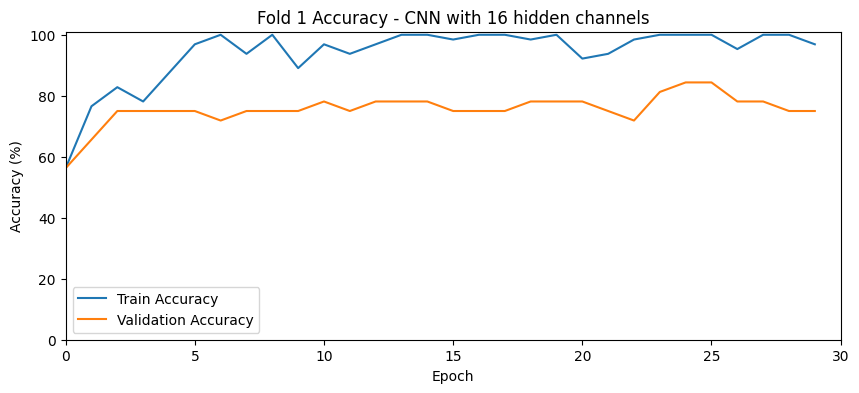

Starting fold 2/3 | Test person: cross_164636 (person_id=164636)
Fold 2 | Epoch 1/30 | Train Acc: 67.19% | Val Acc: 18.75% | Val Loss: 1.2446
Fold 2 | Epoch 2/30 | Train Acc: 87.50% | Val Acc: 40.62% | Val Loss: 1.1543
Fold 2 | Epoch 3/30 | Train Acc: 90.62% | Val Acc: 59.38% | Val Loss: 1.0606
Fold 2 | Epoch 4/30 | Train Acc: 95.31% | Val Acc: 71.88% | Val Loss: 0.9849
Fold 2 | Epoch 5/30 | Train Acc: 95.31% | Val Acc: 65.62% | Val Loss: 0.9507
Fold 2 | Epoch 6/30 | Train Acc: 100.00% | Val Acc: 65.62% | Val Loss: 0.8859
Fold 2 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 68.75% | Val Loss: 0.8435
Fold 2 | Epoch 8/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.8123
Fold 2 | Epoch 9/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.7099
Fold 2 | Epoch 10/30 | Train Acc: 93.75% | Val Acc: 81.25% | Val Loss: 0.6709
Fold 2 | Epoch 11/30 | Train Acc: 93.75% | Val Acc: 71.88% | Val Loss: 0.7547
Fold 2 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.7459
Fold 2

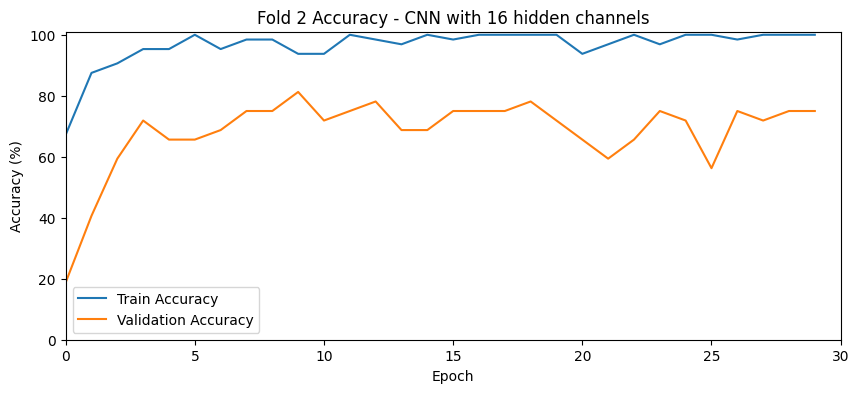

Starting fold 3/3 | Test person: intra_105923 (person_id=105923)
Fold 3 | Epoch 1/30 | Train Acc: 60.94% | Val Acc: 75.00% | Val Loss: 1.1359
Fold 3 | Epoch 2/30 | Train Acc: 90.62% | Val Acc: 93.75% | Val Loss: 0.9784
Fold 3 | Epoch 3/30 | Train Acc: 81.25% | Val Acc: 90.62% | Val Loss: 0.9045
Fold 3 | Epoch 4/30 | Train Acc: 92.19% | Val Acc: 78.12% | Val Loss: 0.8289
Fold 3 | Epoch 5/30 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.7625
Fold 3 | Epoch 6/30 | Train Acc: 92.19% | Val Acc: 78.12% | Val Loss: 0.6940
Fold 3 | Epoch 7/30 | Train Acc: 95.31% | Val Acc: 100.00% | Val Loss: 0.5425
Fold 3 | Epoch 8/30 | Train Acc: 100.00% | Val Acc: 100.00% | Val Loss: 0.4509
Fold 3 | Epoch 9/30 | Train Acc: 96.88% | Val Acc: 93.75% | Val Loss: 0.6009
Fold 3 | Epoch 10/30 | Train Acc: 96.88% | Val Acc: 93.75% | Val Loss: 0.5039
Fold 3 | Epoch 11/30 | Train Acc: 93.75% | Val Acc: 100.00% | Val Loss: 0.3900
Fold 3 | Epoch 12/30 | Train Acc: 100.00% | Val Acc: 100.00% | Val Loss: 0.4792
Fo

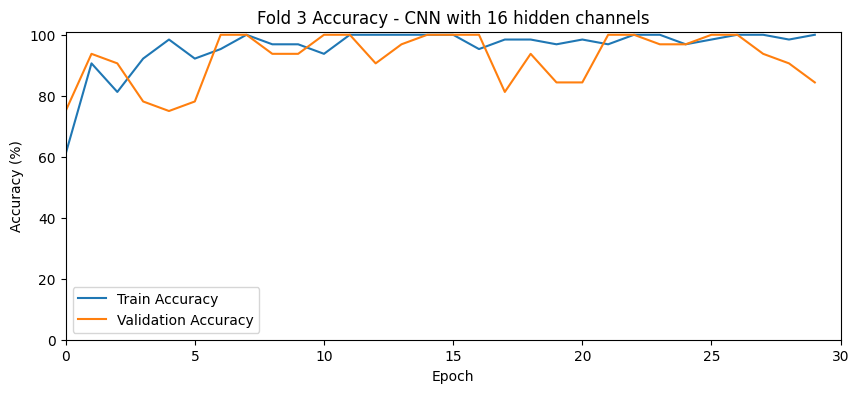

Mean person-level validation accuracy: 82.29%


In [7]:
MEGGAN_FAST_CONFIG = {
    "temporal_hidden": 32,
    "graph_hidden": 64,
    "dropout": 0.25,
    #"attention_dropout": 0.2,
    #"num_neighbors": 6,
}

MEGTCN_CONFIG = {
    "kernel_size": 5,
    "dropout": 0.2,
    "hidden_channels": 64,
}

# cross_validation(
#     MEGTCN,
#     person_splits,
#     batch_size=16,
#     epochs=100,
#     model_kwargs=MEGTCN_CONFIG,
#     weight_decay=1e-4,
#     patience=16,
# )

MHEGAN_CONFIG = {'hidden_channels': 128, 'kernel_size': 7, 'dropout': 0.2, 'num_heads': 2}

CNN_CONFIG = {"kernel_size": 5, "dropout": 0.05, "hidden_channels": 16}

for _ in range(10):
    cross_validation(
        CNNBaseline1D,
        person_splits,
        learning_rate=0.005,
        batch_size=8,
        epochs=30,
        model_kwargs=CNN_CONFIG,
        weight_decay=5e-4,
        patience=8,
    )

# Grid Search, using person splits

In [ ]:
cross_person_splits = build_person_subsets(cross_dataset, "cross")
intra_person_splits = build_person_subsets(intra_dataset, "intra")
person_splits = cross_person_splits + intra_person_splits

print("Person-level folds:")
for split_name, subset, person_id in person_splits:
    print(f"  {split_name}: person_id={person_id}, samples={len(subset)}")

Person-level folds:
  cross_113922: person_id=113922, samples=32
  cross_164636: person_id=164636, samples=32
  intra_105923: person_id=105923, samples=32


# TCN MODEL

In [ ]:
from tcn_model import MEGTCN

param_grid = {
    "learning_rate": [1e-3, 5e-3, 5e-4, 1e-4],
    "kernel_size": [5, 7, 11],
    "dropout": [0.05, 0.1, 0.2, 0.5],
    "hidden_channels": [16, 32, 64],
    "batch_size": [8, 16, 32, 64],
}

top_models = run_person_grid_search(
    model_class=MEGTCN,
    param_grid=param_grid,
    person_splits=person_splits,
    num_classes=4,
    epochs=100
)

Total configs: 144

Testing parameters:
{'learning_rate': 0.005, 'kernel_size': 5, 'dropout': 0.05, 'hidden_channels': 16, 'batch_size': 8}

Fold 1/3 | Test person: 113922
Fold 1 | Epoch 1/100 | Train Acc: 65.62% | Val Acc: 75.00% | Val Loss: 0.9204
Fold 1 | Epoch 2/100 | Train Acc: 85.94% | Val Acc: 56.25% | Val Loss: 1.1517
Fold 1 | Epoch 3/100 | Train Acc: 90.62% | Val Acc: 78.12% | Val Loss: 0.8830
Fold 1 | Epoch 4/100 | Train Acc: 98.44% | Val Acc: 65.62% | Val Loss: 1.2711
Fold 1 | Epoch 5/100 | Train Acc: 95.31% | Val Acc: 65.62% | Val Loss: 1.5847
Fold 1 | Epoch 6/100 | Train Acc: 100.00% | Val Acc: 62.50% | Val Loss: 1.5618
Fold 1 | Epoch 7/100 | Train Acc: 98.44% | Val Acc: 59.38% | Val Loss: 1.5392
Fold 1 | Epoch 8/100 | Train Acc: 100.00% | Val Acc: 59.38% | Val Loss: 1.5767
Fold 1 | Epoch 9/100 | Train Acc: 100.00% | Val Acc: 53.12% | Val Loss: 1.7620
Fold 1 | Epoch 10/100 | Train Acc: 100.00% | Val Acc: 56.25% | Val Loss: 1.7855
Fold 1 | Epoch 11/100 | Train Acc: 100.00% 

In [ ]:
results = evaluate_top_models_person_cv(
    model_class=MEGTCN,
    top_models=top_models,
    person_splits=person_splits,
    num_classes=4,
    device=DEVICE,
    n_runs=25,
)


MODEL 1
{'learning_rate': 0.005, 'kernel_size': 5, 'dropout': 0.1, 'hidden_channels': 16, 'batch_size': 32}

Run 1/25
  Fold 1/3 | Person 113922 | Acc 71.88%
  Fold 2/3 | Person 164636 | Acc 59.38%
  Fold 3/3 | Person 105923 | Acc 78.12%
Run 1 Mean Person-CV Accuracy: 69.79%

Run 2/25
  Fold 1/3 | Person 113922 | Acc 46.88%
  Fold 2/3 | Person 164636 | Acc 56.25%
  Fold 3/3 | Person 105923 | Acc 75.00%
Run 2 Mean Person-CV Accuracy: 59.38%

Run 3/25
  Fold 1/3 | Person 113922 | Acc 71.88%
  Fold 2/3 | Person 164636 | Acc 59.38%
  Fold 3/3 | Person 105923 | Acc 78.12%
Run 3 Mean Person-CV Accuracy: 69.79%

Run 4/25
  Fold 1/3 | Person 113922 | Acc 71.88%
  Fold 2/3 | Person 164636 | Acc 71.88%
  Fold 3/3 | Person 105923 | Acc 68.75%
Run 4 Mean Person-CV Accuracy: 70.83%

Run 5/25
  Fold 1/3 | Person 113922 | Acc 65.62%
  Fold 2/3 | Person 164636 | Acc 62.50%
  Fold 3/3 | Person 105923 | Acc 96.88%
Run 5 Mean Person-CV Accuracy: 75.00%

Run 6/25
  Fold 1/3 | Person 113922 | Acc 71.88%
 

# GAN MODEL

In [ ]:
# from gan_model_simple import MEGGAN

param_grid = {
    "learning_rate": [5e-3],
    "hidden_channels": [32],
    "kernel_size": [3],
    "dropout": [0.1],
    "num_heads": [2],
    "weight_decay": [1e-4],
    "batch_size": [8],
}

top_models = run_person_grid_search(
    model_class=MEGGAN,
    param_grid=param_grid,
    person_splits=person_splits,
    num_classes=4,
    epochs=100,
    patience=20
)

Total configs: 1

Testing parameters:
{'learning_rate': 0.005, 'hidden_channels': 32, 'kernel_size': 3, 'dropout': 0.1, 'num_heads': 2, 'weight_decay': 0.0001, 'batch_size': 8}

Fold 1/3 | Test person: 113922
Fold 1 | Epoch 1/100 | Train Acc: 76.56% | Val Acc: 71.88% | Val Loss: 1.0330
Fold 1 | Epoch 2/100 | Train Acc: 90.62% | Val Acc: 65.62% | Val Loss: 1.0388
Fold 1 | Epoch 3/100 | Train Acc: 96.88% | Val Acc: 68.75% | Val Loss: 0.8714
Fold 1 | Epoch 4/100 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.8274
Fold 1 | Epoch 5/100 | Train Acc: 95.31% | Val Acc: 62.50% | Val Loss: 0.9464
Fold 1 | Epoch 6/100 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.7495
Fold 1 | Epoch 7/100 | Train Acc: 100.00% | Val Acc: 81.25% | Val Loss: 0.5769
Fold 1 | Epoch 8/100 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.5855
Fold 1 | Epoch 9/100 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.6641
Fold 1 | Epoch 10/100 | Train Acc: 100.00% | Val Acc: 75.00% | Val Loss: 0.6447
Fold 1

In [ ]:
results = evaluate_top_models_person_cv(
    model_class=MEGGAN,
    top_models=top_models,
    person_splits=person_splits,
    num_classes=4,
    device=DEVICE,
    n_runs=25,
)


MODEL 1
{'learning_rate': 0.005, 'hidden_channels': 32, 'kernel_size': 3, 'dropout': 0.1, 'num_heads': 2, 'weight_decay': 0.0001, 'batch_size': 8}

Run 1/25
  Fold 1/3 | Person 113922 | Acc 75.00%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 65.62%
Run 1 Mean Person-CV Accuracy: 71.88%

Run 2/25
  Fold 1/3 | Person 113922 | Acc 78.12%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 90.62%
Run 2 Mean Person-CV Accuracy: 81.25%

Run 3/25
  Fold 1/3 | Person 113922 | Acc 62.50%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 93.75%
Run 3 Mean Person-CV Accuracy: 77.08%

Run 4/25
  Fold 1/3 | Person 113922 | Acc 81.25%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 87.50%
Run 4 Mean Person-CV Accuracy: 81.25%

Run 5/25
  Fold 1/3 | Person 113922 | Acc 62.50%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 100.00%
Run 5 Mean Person-CV Accuracy: 79.17%

Run 6/25
 

# CNN MODEL

In [ ]:
param_grid = {
    "learning_rate": [1e-3, 5e-3, 5e-4, 1e-4],
    "kernel_size": [5, 7, 11],
    "dropout": [0.05, 0.1, 0.2, 0.5],
    "hidden_channels": [16, 32, 64],
    "batch_size": [8, 16, 32, 64],
}

top_models = run_person_grid_search(
    model_class=CNNBaseline1D,
    param_grid=param_grid,
    person_splits=person_splits,
    num_classes=4,
    epochs=100
)

Total configs: 576

Testing parameters:
{'learning_rate': 0.001, 'kernel_size': 5, 'dropout': 0.05, 'hidden_channels': 16, 'batch_size': 8}

Fold 1/3 | Test person: 113922
Fold 1 | Epoch 1/100 | Train Acc: 53.12% | Val Acc: 56.25% | Val Loss: 1.2422
Fold 1 | Epoch 2/100 | Train Acc: 79.69% | Val Acc: 65.62% | Val Loss: 1.2186
Fold 1 | Epoch 3/100 | Train Acc: 79.69% | Val Acc: 65.62% | Val Loss: 1.1084
Fold 1 | Epoch 4/100 | Train Acc: 92.19% | Val Acc: 68.75% | Val Loss: 1.0420
Fold 1 | Epoch 5/100 | Train Acc: 92.19% | Val Acc: 68.75% | Val Loss: 0.9979
Fold 1 | Epoch 6/100 | Train Acc: 98.44% | Val Acc: 75.00% | Val Loss: 0.9400
Fold 1 | Epoch 7/100 | Train Acc: 100.00% | Val Acc: 68.75% | Val Loss: 0.8894
Fold 1 | Epoch 8/100 | Train Acc: 96.88% | Val Acc: 75.00% | Val Loss: 0.8632
Fold 1 | Epoch 9/100 | Train Acc: 96.88% | Val Acc: 71.88% | Val Loss: 0.8243
Fold 1 | Epoch 10/100 | Train Acc: 95.31% | Val Acc: 75.00% | Val Loss: 0.7762
Fold 1 | Epoch 11/100 | Train Acc: 100.00% | V

In [ ]:
results = evaluate_top_models_person_cv(
    model_class=CNNBaseline1D,
    top_models=top_models,
    person_splits=person_splits,
    num_classes=4,
    device=DEVICE,
    n_runs=25,
)


MODEL 1
{'learning_rate': 0.001, 'kernel_size': 5, 'dropout': 0.05, 'hidden_channels': 16, 'batch_size': 8}

Run 1/25
  Fold 1/3 | Person 113922 | Acc 87.50%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 96.88%
Run 1 Mean Person-CV Accuracy: 86.46%

Run 2/25
  Fold 1/3 | Person 113922 | Acc 78.12%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 100.00%
Run 2 Mean Person-CV Accuracy: 84.38%

Run 3/25
  Fold 1/3 | Person 113922 | Acc 78.12%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 93.75%
Run 3 Mean Person-CV Accuracy: 82.29%

Run 4/25
  Fold 1/3 | Person 113922 | Acc 75.00%
  Fold 2/3 | Person 164636 | Acc 50.00%
  Fold 3/3 | Person 105923 | Acc 96.88%
Run 4 Mean Person-CV Accuracy: 73.96%

Run 5/25
  Fold 1/3 | Person 113922 | Acc 75.00%
  Fold 2/3 | Person 164636 | Acc 75.00%
  Fold 3/3 | Person 105923 | Acc 96.88%
Run 5 Mean Person-CV Accuracy: 82.29%

Run 6/25
  Fold 1/3 | Person 113922 | Acc 87.50%


# MLP MODEL

In [ ]:
param_grid = {
    "learning_rate": [1e-3, 5e-3, 5e-4, 1e-4],
    "dropout": [0.05, 0.1, 0.2, 0.5],
    "hidden_size": [16, 32, 64],
    "batch_size": [8, 16, 32, 64],
}

top_models = run_person_grid_search(
    model_class=MLP,
    param_grid=param_grid,
    person_splits=person_splits,
    num_classes=4,
    epochs=100
)

Total configs: 192

Testing parameters:
{'learning_rate': 0.001, 'dropout': 0.05, 'hidden_size': 16, 'batch_size': 8}

Fold 1/3 | Test person: 113922
Fold 1 | Epoch 1/100 | Train Acc: 59.38% | Val Acc: 62.50% | Val Loss: 22.4114
Fold 1 | Epoch 2/100 | Train Acc: 71.88% | Val Acc: 50.00% | Val Loss: 44.8741
Fold 1 | Epoch 3/100 | Train Acc: 82.81% | Val Acc: 56.25% | Val Loss: 30.1027
Fold 1 | Epoch 4/100 | Train Acc: 98.44% | Val Acc: 50.00% | Val Loss: 38.8843
Fold 1 | Epoch 5/100 | Train Acc: 95.31% | Val Acc: 46.88% | Val Loss: 61.3062
Fold 1 | Epoch 6/100 | Train Acc: 93.75% | Val Acc: 46.88% | Val Loss: 66.3728
Fold 1 | Epoch 7/100 | Train Acc: 96.88% | Val Acc: 62.50% | Val Loss: 70.0223
Fold 1 | Epoch 8/100 | Train Acc: 98.44% | Val Acc: 59.38% | Val Loss: 70.8860
Fold 1 | Epoch 9/100 | Train Acc: 95.31% | Val Acc: 62.50% | Val Loss: 79.8896
Early stopping at epoch 9 after 8 non-improving epochs.

Fold 2/3 | Test person: 164636
Fold 2 | Epoch 1/100 | Train Acc: 64.06% | Val Acc:

In [ ]:
results = evaluate_top_models_person_cv(
    model_class=MLP,
    top_models=top_models,
    person_splits=person_splits,
    num_classes=4,
    device=DEVICE,
    n_runs=25,
)


MODEL 1
{'learning_rate': 0.001, 'dropout': 0.05, 'hidden_size': 16, 'batch_size': 8}

Run 1/25
  Fold 1/3 | Person 113922 | Acc 56.25%
  Fold 2/3 | Person 164636 | Acc 37.50%
  Fold 3/3 | Person 105923 | Acc 46.88%
Run 1 Mean Person-CV Accuracy: 46.88%

Run 2/25
  Fold 1/3 | Person 113922 | Acc 28.12%
  Fold 2/3 | Person 164636 | Acc 46.88%
  Fold 3/3 | Person 105923 | Acc 46.88%
Run 2 Mean Person-CV Accuracy: 40.62%

Run 3/25
  Fold 1/3 | Person 113922 | Acc 62.50%
  Fold 2/3 | Person 164636 | Acc 46.88%
  Fold 3/3 | Person 105923 | Acc 56.25%
Run 3 Mean Person-CV Accuracy: 55.21%

Run 4/25
  Fold 1/3 | Person 113922 | Acc 59.38%
  Fold 2/3 | Person 164636 | Acc 81.25%
  Fold 3/3 | Person 105923 | Acc 46.88%
Run 4 Mean Person-CV Accuracy: 62.50%

Run 5/25
  Fold 1/3 | Person 113922 | Acc 56.25%
  Fold 2/3 | Person 164636 | Acc 46.88%
  Fold 3/3 | Person 105923 | Acc 31.25%
Run 5 Mean Person-CV Accuracy: 44.79%

Run 6/25
  Fold 1/3 | Person 113922 | Acc 59.38%
  Fold 2/3 | Person 164